In [54]:
#imports

import pandas as pd
import numpy as np
import seaborn as sns
import math
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

#Random Forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import export_graphviz

#default fig size
plt.rcParams['figure.figsize'] = [10, 5]



In [27]:
#load data

data = pd.read_csv("data/data.csv")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB


In [28]:
#check for NA
data_isna = data.isna().sum()/len(data)*100
data_isna[data_isna>0].sort_values(ascending=False)

292    91.193363
157    91.193363
158    91.193363
293    91.193363
220    85.577537
         ...    
182     0.063816
181     0.063816
180     0.063816
179     0.063816
589     0.063816
Length: 538, dtype: float64

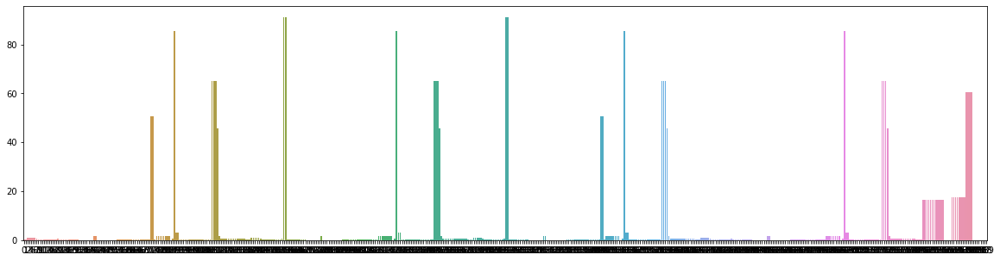

In [29]:
plt.rcParams['figure.figsize'] = [20, 5]
na_gt_zero = data_isna[data_isna>0]
sns.barplot(x=na_gt_zero.index,y=na_gt_zero)

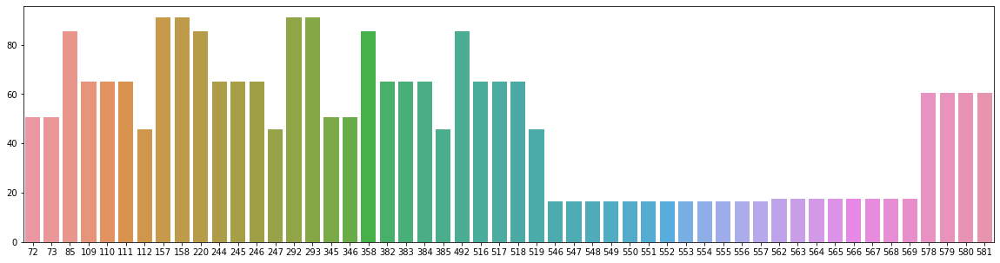

In [30]:
#replot with limit = 15%
#15% of 1567 is 235 rows
plt.rcParams['figure.figsize'] = [20, 5]
na_gt_limit = data_isna[data_isna>15]
sns.barplot(x=na_gt_limit.index,y=na_gt_limit)

In [31]:
na_gt_limit.index

Index(['72', '73', '85', '109', '110', '111', '112', '157', '158', '220',
       '244', '245', '246', '247', '292', '293', '345', '346', '358', '382',
       '383', '384', '385', '492', '516', '517', '518', '519', '546', '547',
       '548', '549', '550', '551', '552', '553', '554', '555', '556', '557',
       '562', '563', '564', '565', '566', '567', '568', '569', '578', '579',
       '580', '581'],
      dtype='object')

In [32]:
data.drop(na_gt_limit.index, inplace=True, axis=1)
print("done")

done


In [38]:
#Train-test split
data_x = data.drop(['Time','Pass/Fail'], axis=1)
data_y=data['Pass/Fail']
na_filler = 99999999999999
X_train, X_test, y_train, y_test = train_test_split(data_x.fillna(na_filler), data_y, test_size=0.2, random_state = 42)

In [43]:
#Random Forest modelling
tree_model = RandomForestClassifier(oob_score = True, n_estimators=100)
tree_model.get_params()



{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': True,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [44]:
tree_model.fit(X_train,y_train)
print("train score:",tree_model.score(X_train, y_train))
print("train oob score:",tree_model.oob_score_)
print("test score:", tree_model.score(X_test,y_test))


train score: 1.0
train oob score: 0.9361532322426177
test score: 0.9203821656050956


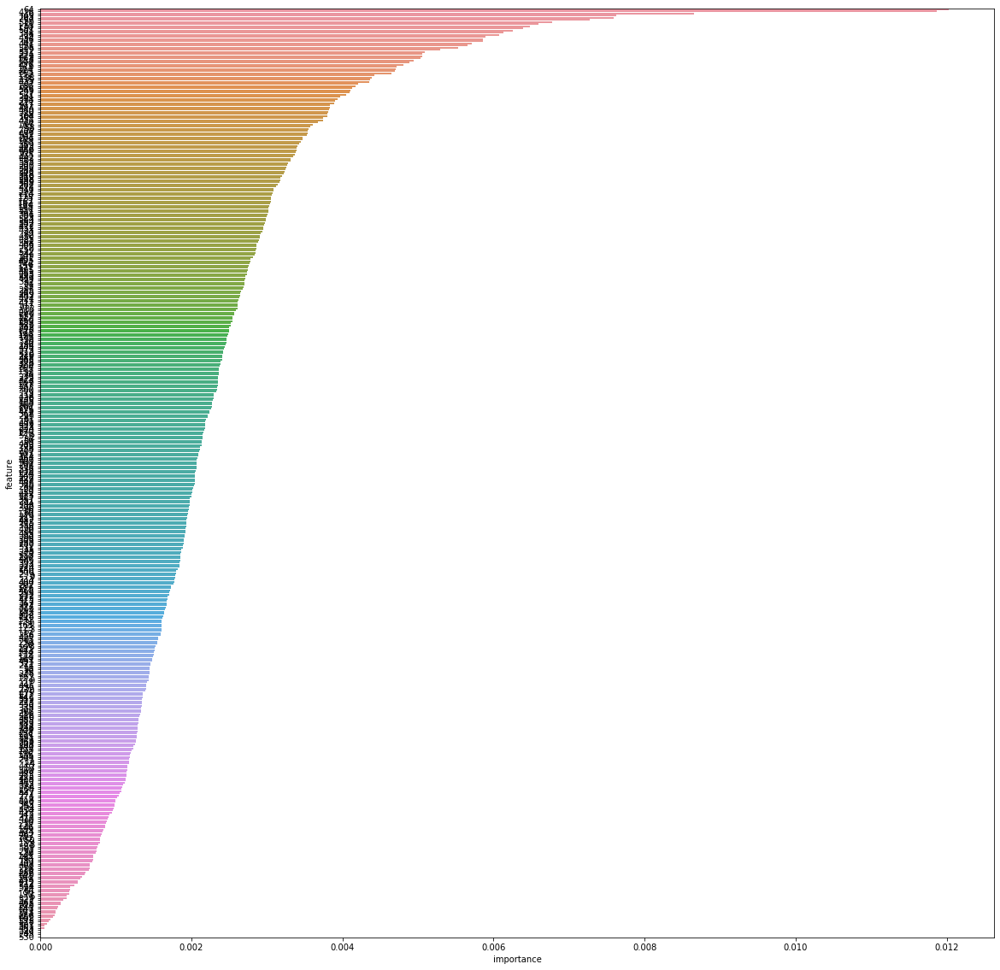

In [51]:
tree_model_params = pd.DataFrame({'feature':X_train.columns,'importance':tree_model.feature_importances_}).sort_values(by='importance',ascending=False)
tree_model_params.to_csv("tree_model_params.csv")
plt.rcParams['figure.figsize'] = [20, 20]
filter=435 #goes to zero at around 435
sns.barplot(x=tree_model_params['importance'][:filter],y=tree_model_params['feature'][:filter])



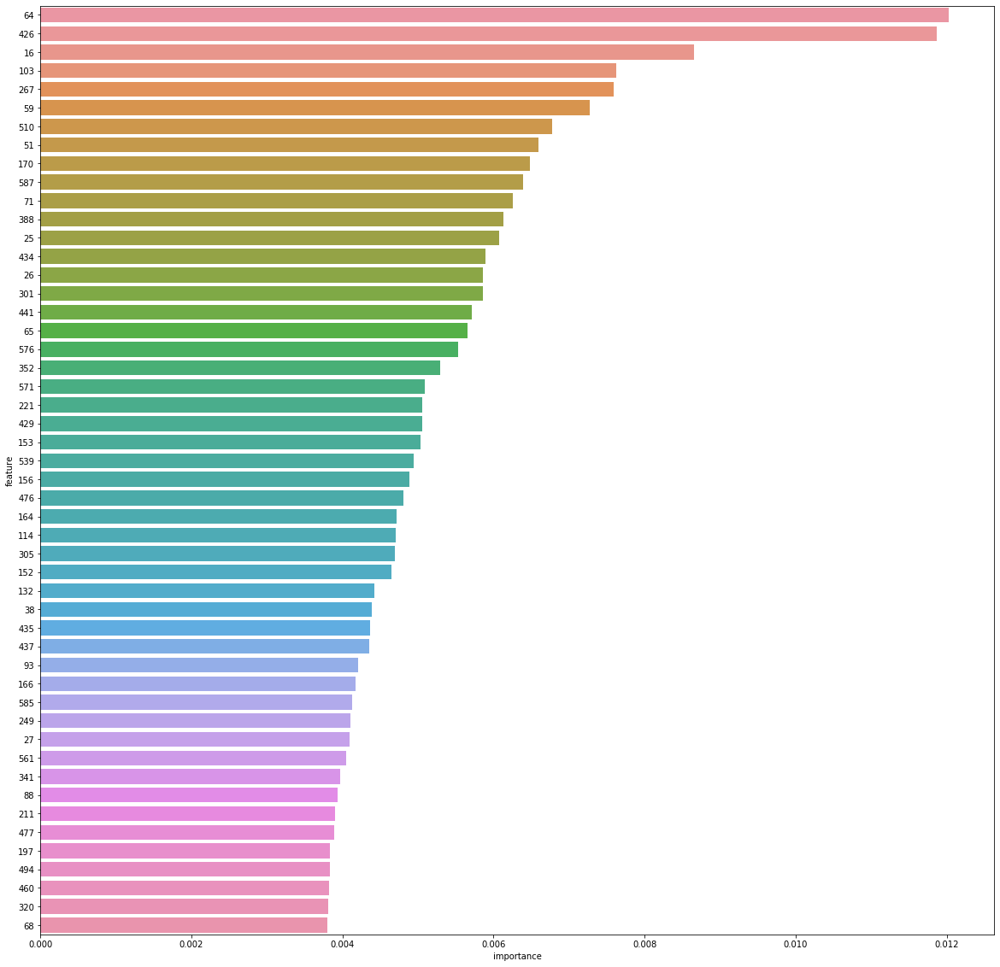

In [52]:
filter=50 #goes to zero at around 435
sns.barplot(x=tree_model_params['importance'][:filter],y=tree_model_params['feature'][:filter])

In [53]:
data['64']

0       21.7264
1       19.1927
2       16.1755
3       15.6209
4       32.2945
         ...   
1562    17.1818
1563    23.3555
1564    18.8336
1565    15.5318
1566    18.1282
Name: 64, Length: 1567, dtype: float64

In [78]:
#visualize tree
estimator = tree_model.estimators_[5]

predictor_names = y_train
column_names = [str(x) for x in X_train.columns ]
predictor_names = [str(y) for y in y_train.unique()]
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = column_names,
                class_names = predictor_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')


In [76]:
from sklearn.datasets import load_iris
iris = load_iris()

# Model (can also use single decision tree)
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=10)

# Train
model.fit(iris.data, iris.target)
# Extract single tree
estimator = model.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = iris.feature_names,
                class_names = iris.target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [67]:
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [69]:
y_train.unique()

array([-1,  1])

In [73]:
str([1,2,3])

'[1, 2, 3]'

In [74]:
[str(x) for x in [1,2,3]]

['1', '2', '3']